##### Copyright 2020 The TensorFlow Authors.

# Simple audio recognition: Recognizing keywords

---

# 간단한 음성 인식: 키워드 인식하기

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/audio/simple_audio">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/audio/simple_audio.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/audio/simple_audio.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/audio/simple_audio.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This tutorial will show you how to build a basic speech recognition network that recognizes ten different words. It's important to know that real speech and audio recognition systems are much more complex, but like MNIST for images, it should give you a basic understanding of the techniques involved. Once you've completed this tutorial, you'll have a model that tries to classify a one second audio clip as "down", "go", "left", "no", "on", "off", "right", "stop", "up" and "yes".

---

이 튜토리얼에서는 10가지 다른 단어를 인식하는 기본적인 음성 인식 네트워크를 구축하는 방법을 보여줍니다. 실제 음성 및 오디오 인식 시스템은 훨씬 더 복잡하지만, 이미지 분야의 MNIST 예제처럼 이 튜토리얼을 통해 관련된 기술에 대한 기본적인 이해를 얻을 수 있습니다. 이 튜토리얼을 완료하면 1초 길이의 오디오 클립을 "down", "go", "left", "no", "on", "off", "right", "stop", "up" 및 "yes" 중 하나로 분류하는 모델을 제작하게됩니다.

## env
1. python     :3.8.0
2. Tensorflow :2.4.0



## Setup

Import necessary modules and dependencies.

---

## 설정

필요한 모듈과 종속성을 가져옵니다.

In [155]:
import os       # Importing os modules for operations related to the operating system     운영체제 관련 작업을 위한 os 모듈 임포트
import pathlib  # Importing pathlib modules for file path related operations              파일 경로 관련 작업을 위한 pathlib 모듈 임포트

import matplotlib.pyplot as plt     # Matplotlib.pyplot import for data visualization (use as plt)   데이터 시각화를 위한 matplotlib.pyplot 임포트 (plt로 사용)
import numpy as np                  # numpy import for numerical operations (use as np)              수치 연산을 위한 numpy 임포트 (np로 사용)
import seaborn as sns               # Seaborn import for enhanced visualization (using as sns)       향상된 시각화를 위한 seaborn 임포트 (sns로 사용)
import tensorflow as tf             # TensorFlow Library Import (used as tf)                         텐서플로우 라이브러리 임포트 (tf로 사용)

from tensorflow.keras.layers.experimental import preprocessing  # TensorFlow Keras' Preprocessing Layer Import 텐서플로우 케라스의 전처리 레이어 임포트
from tensorflow.keras import layers                             # Importing Layer Module in TensorFlow Keras   텐서플로우 케라스의 레이어 모듈 임포트
from tensorflow.keras import models                             # Importing Model Modules in TensorFlow Keras  텐서플로우 케라스의 모델 모듈 임포트
from IPython import display                                     # Importing a display module for displaying audio, etc. in an IPython environment 
                                                                # IPython 환경에서 오디오 등을 표시하기 위한 display 모듈 임포트


#Set seed for experimental reproducibility # Seed for experimental reproducibility (maintain original annotation)
# Set seed for experiment reproducibility # 실험 재현성을 위한 시드 설정 (원문 주석 유지)
seed = 42                   # Set seed value 시드 값 설정
tf.random.set_seed(seed)    # Fixed a TensorFlow Random Seed 텐서플로우 랜덤 시드 고정
np.random.seed(seed)        # np Random Seed Fixed 넘파이 랜덤 시드 고정


## Import the Speech Commands dataset

You'll write a script to download a portion of the [Speech Commands dataset](https://www.tensorflow.org/datasets/catalog/speech_commands). The original dataset consists of over 105,000 WAV audio files of people saying thirty different words. This data was collected by Google and released under a CC BY license, and you can help improve it by [contributing five minutes of your own voice](https://aiyprojects.withgoogle.com/open_speech_recording).

You'll be using the dataset. Extract the `speech_commands.zip` and load it in using the `tf.data` API.

---

## Speech Commands 데이터셋 가져오기

[Speech Commands dataset](https://www.tensorflow.org/datasets/catalog/speech_commands)의 일부를 다운로드하는 스크립트를 작성합니다. 
원본 데이터셋은 30개의 다른 단어를 말하는 사람들의 105,000개가 넘는 WAV 오디오 파일로 구성됩니다. 
이 데이터는 Google에서 수집하여 CC BY 라이선스로 공개했습니다. 위 데이터셋을 개선하기위하여 도움을 줄수 있습니다.(영문 url 참고)

 데이터셋를 사용할 것입니다. `speech_commands.zip` 파일의 압축을 풀고 `tf.data` API를 사용하여 로드합니다.

In [156]:
data_dir = pathlib.Path('/data')
if not data_dir.exists():                 # If the data directory does not exist 데이터 디렉토리가 존재하지 않으면
  tf.keras.utils.get_file(
      'speech_commands_v0.02.tar.gz',         
      origin="http://download.tensorflow.org/data/speech_commands_v0.02.tar.gz",
      extract=True,                       # Whether to decompress after downloading 다운로드 후 압축 해제 여부
      cache_dir='.', cache_subdir='data') # Set up cache directories and subdirectories (saved in the 'data' folder under the current directory)
                                          # 캐시 디렉토리 및 하위 디렉토리 설정 (현재 디렉토리 아래 'data' 폴더에 저장)


Check basic statistics about the dataset.

---

데이터셋에 대한 기본 통계를 확인합니다.

In [157]:
commands = np.array(tf.io.gfile.listdir(str("data"))) # Get a list of files/folder in the data directory and convert it into a numpy array (command list) 
                                                        # 데이터 디렉토리 내의 파일/폴더 목록을 가져와 numpy 배열로 변환 (명령어 목록)

items_to_exclude = [
    'README.md', 'speech_commands_v0.02.tar.gz', '.DS_Store',
    'LICENSE', 'testing_list.txt', 'validation_list.txt',
    '_background_noise_']
commands = [cmd for cmd in commands if cmd not in items_to_exclude]          # Exclude 'README.md 'etc file from "commands" list \ "commands" 목록에서 'README.md' 파일등 제외
print('Commands:', commands)                            # Final "Commands" List Output \ 최종 "commands" 목록 출력


Commands: ['no', 'off', 'on', 'yes']


Extract the audio files into a list and shuffle it.

---

오디오 파일을 리스트로 추출하고 섞습니다.

In [158]:
from pathlib import Path
data_dir="data"
data_dir = Path(data_dir)

In [159]:
filenames = tf.io.gfile.glob(str(data_dir) + '/*/*')  # Gets all audio file paths within each "mini_speech_Commands" folder 
                                                      # 각 "mini_speech_Commands" 폴더 내의 모든 오디오 파일 경로를 가져옴
filenames = tf.random.shuffle(filenames)              # Mixing a list of files at random 파일 목록을 무작위로 섞음
num_samples = len(filenames)                          # Calculate the total number of samples (audio files) 전체 샘플(오디오 파일) 개수 계산
print('Number of total examples:', num_samples)       # Output total number of samples 전체 샘플 개수 출력
print('Number of examples per label:',len(tf.io.gfile.listdir(str(data_dir/commands[0]))))  # Output of samples per label (command) (calculated based on the first command)
                                                            # 각 레이블(명령어)당 샘플 개수 출력 (첫 번째 명령어를 기준으로 계산)
print('Example file tensor:', filenames[0])                 # Output the first file path (tensor) in the mixed file list
                                                            #  섞인 파일 목록 중 첫 번째 파일 경로(텐서) 출력


Number of total examples: 7973
Number of examples per label: 2097
Example file tensor: tf.Tensor(b'data\\no\\6272b231_nohash_0.wav', shape=(), dtype=string)


Split the files into training, validation and test sets using a 80:10:10 ratio, respectively.

---

파일을 훈련, 검증, 테스트 세트로 각각 80:10:10 비율로 분할합니다.

In [161]:
train_files = filenames[:5000]          # Training Dataset File List (from scratch 84668)      훈련 데이터셋 파일 목록 (처음부터 84668개)
val_files = filenames[5001:5001 + 550] # Val Dataset File List (84669th to 10583)          검증 데이터셋 파일 목록 (84669번째부터 10583개)
test_files = filenames[-550:]           # Test Dataset File List (last 10583)                 테스트 데이터셋 파일 목록 (마지막 10583개)

print('Training set size', len(train_files)) # Training Set Size Output Train셋 크기 출력
print('Validation set size', len(val_files)) # Val Set Size Output      Val 셋 크기 출력
print('Test set size', len(test_files))      # Test Set Size Output     테스트 셋 크기 출력


Training set size 5000
Validation set size 550
Test set size 550


## Reading audio files and their labels

---

## 오디오 파일과 레이블 읽기

The audio file will initially be read as a binary file, which you'll want to convert into a numerical tensor.

To load an audio file, you will use [`tf.audio.decode_wav`](https://www.tensorflow.org/api_docs/python/tf/audio/decode_wav), which returns the WAV-encoded audio as a Tensor and the sample rate.

A WAV file contains time series data with a set number of samples per second. 
Each sample represents the amplitude of the audio signal at that specific time. In a 16-bit system, like the files in `mini_speech_commands`, the values range from -32768 to 32767. 
The sample rate for this dataset is 16kHz.
Note that `tf.audio.decode_wav` will normalize the values to the range [-1.0, 1.0].

---

오디오 파일은 처음에 바이너리 파일로 읽히며, 이를 숫자 텐서로 변환해야 합니다.

오디오 파일을 로드하기 위해 [`tf.audio.decode_wav`](https://www.tensorflow.org/api_docs/python/tf/audio/decode_wav)를 사용합니다. 이 [`tf.audio.decode_wav`](https://www.tensorflow.org/api_docs/python/tf/audio/decode_wav) 함수는 WAV로 인코딩된 오디오를 텐서와 샘플링 속도로 반환합니다.

WAV 파일은 초당 정해진 수의 샘플을 가진 시계열 데이터를 포함합니다.
각 샘플은 특정 시간에서의 오디오 신호 진폭을 나타냅니다. `mini_speech_commands`의 파일과 같은 16비트 시스템에서는 값이 -32768에서 32767까지의 범위를 갖습니다.
이 데이터셋의 샘플링 속도는 16kHz입니다.
`tf.audio.decode_wav`는 값을 [-1.0, 1.0] 범위로 정규화합니다.

In [162]:
def decode_audio(audio_binary):
  audio, _ = tf.audio.decode_wav(audio_binary)
  return tf.squeeze(audio, axis=-1)

The label for each WAV file is its parent directory.

---

각 WAV 파일의 레이블은 부모 디렉토리입니다.

In [163]:
def get_label(file_path):
  parts = tf.strings.split(file_path, os.path.sep)

  # Note: You'll use indexing here instead of tuple unpacking to enable this 
  # to work in a TensorFlow graph.
  return parts[-2] 

Let's define a method that will take in the filename of the WAV file and output a tuple containing the audio and labels for supervised training.

---

WAV 파일의 파일명을 입력으로 받아 지도 학습을 위한 오디오와 레이블을 포함하는 튜플을 출력하는 메서드를 정의해 보겠습니다.

In [164]:
def get_waveform_and_label(file_path):
  label = get_label(file_path)
  audio_binary = tf.io.read_file(file_path)
  waveform = decode_audio(audio_binary)
  return waveform, label

You will now apply `process_path` to build your training set to extract the audio-label pairs and check the results. You'll build the validation and test sets using a similar procedure later on.

---

이제 `process_path`를 적용하여 훈련 세트를 구축하고 오디오-레이블 쌍을 추출한 후 결과를 확인합니다. 나중에 비슷한 절차를 사용하여 검증 및 테스트 세트를 구축할 것입니다.

In [165]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
files_ds = tf.data.Dataset.from_tensor_slices(train_files)
waveform_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)

Let's examine a few audio waveforms with their corresponding labels.

---

몇 가지 오디오 파형과 해당 레이블을 살펴보겠습니다.

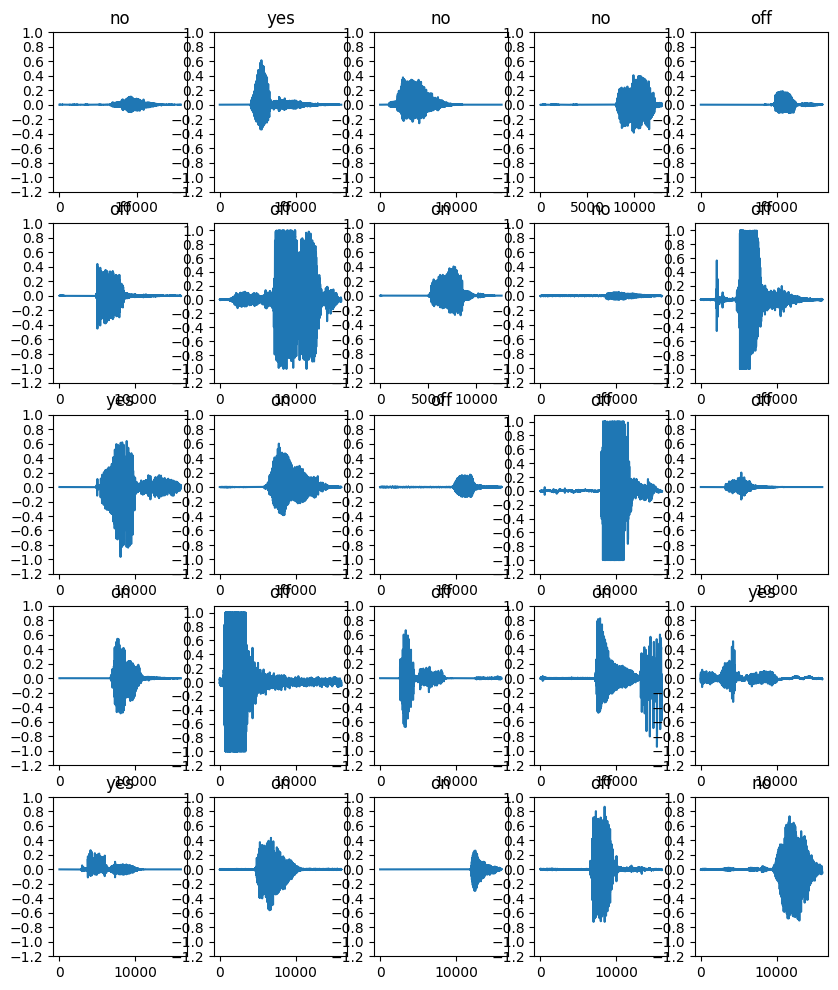

In [166]:
rows = 5
cols = 5
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(10, 12))
for i, (audio, label) in enumerate(waveform_ds.take(n)):
  r = i // cols
  c = i % cols
  ax = axes[r][c]
  ax.plot(audio.numpy())
  ax.set_yticks(np.arange(-1.2, 1.2, 0.2))
  label = label.numpy().decode('utf-8')
  ax.set_title(label)

plt.show()

## Spectrogram

You'll convert the waveform into a spectrogram, which shows frequency changes over time and can be represented as a 2D image. This can be done by applying the short-time Fourier transform (STFT) to convert the audio into the time-frequency domain.

A Fourier transform ([`tf.signal.fft`](https://www.tensorflow.org/api_docs/python/tf/signal/fft)) converts a signal to its component frequencies, but loses all time information. The STFT ([`tf.signal.stft`](https://www.tensorflow.org/api_docs/python/tf/signal/stft)) splits the signal into windows of time and runs a Fourier transform on each window, preserving some time information, and returning a 2D tensor that you can run standard convolutions on.

STFT produces an array of complex numbers representing magnitude and phase. However, you'll only need the magnitude for this tutorial, which can be derived by applying `tf.abs` on the output of `tf.signal.stft`. 

Choose `frame_length` and `frame_step` parameters such that the generated spectrogram "image" is almost square. For more information on STFT parameters choice, you can refer to [this video](https://www.coursera.org/lecture/audio-signal-processing/stft-2-tjEQe) on audio signal processing. 

You also want the waveforms to have the same length, so that when you convert it to a spectrogram image, the results will have similar dimensions. This can be done by simply zero padding the audio clips that are shorter than one second.

---

## 스펙트로그램

파형을 스펙트로그램으로 변환합니다. 스펙트로그램은 시간 경과에 따른 주파수 변화를 보여주며 2D 이미지로 표현될 수 있습니다. 이는 단시간 푸리에 변환(STFT)을 적용하여 오디오를 시간-주파수 영역으로 변환함으로써 수행할 수 있습니다.

푸리에 변환 ([`tf.signal.fft`](https://www.tensorflow.org/api_docs/python/tf/signal/fft))은 신호를 구성 주파수로 변환하지만 모든 시간 정보를 잃습니다. STFT ([`tf.signal.stft`](https://www.tensorflow.org/api_docs/python/tf/signal/stft))는 신호를 시간 창으로 분할하고 각 창에서 푸리에 변환을 실행하여 일부 시간 정보를 보존하고 표준 컨볼루션을 실행할 수 있는 2D 텐서를 반환합니다.

STFT는 크기와 위상을 나타내는 복소수 배열을 생성합니다. 그러나 이 튜토리얼에서는 크기만 필요하며, 이는 `tf.signal.stft`의 출력에 `tf.abs`를 적용하여 얻을 수 있습니다.

생성된 스펙트로그램 "이미지"가 거의 정사각형이 되도록 `frame_length` 및 `frame_step` 매개변수를 선택합니다. STFT 매개변수 선택에 대한 자세한 내용은 오디오 신호 처리에 대한 [이 비디오](https://www.coursera.org/lecture/audio-signal-processing/stft-2-tjEQe)를 참조할 수 있습니다.

또한 파형이 동일한 길이를 갖도록 하여 스펙트로그램 이미지로 변환할 때 결과가 비슷한 차원을 갖도록 합니다. 이는 1초보다 짧은 오디오 클립을 단순히 0으로 채움(zero padding)으로써 수행할 수 있습니다.

In [167]:
def get_spectrogram(waveform):
  # Cast the waveform to float32, as STFT expects float32 or float64.
  # STFT는 float32 또는 float64를 예상하므로 웨이브폼을 float32로 변환합니다.
  waveform = tf.cast(waveform, tf.float32)
  
  # Define the target length for the audio samples (e.g., 16000 for 1 second at 16kHz).
  # 오디오 샘플의 목표 길이를 정의합니다 (예: 16kHz에서 1초 동안 16000 샘플).
  target_len = 16000

  # Make the waveform to be of target_len.
  # 웨이브폼의 길이를 target_len으로 만듭니다.
  
  # First, pad the waveform with zeros on the right if it's shorter than target_len.
  # 먼저, 웨이브폼이 target_len보다 짧을 경우 오른쪽에 0을 패딩합니다.
  # tf.shape(waveform)[0] is the current length of the waveform.
  # tf.shape(waveform)[0]은 웨이브폼의 현재 길이입니다.
  # target_len - tf.shape(waveform)[0] is the amount of padding needed. If negative, it's clipped to 0 by tf.maximum(0, ...).
  # target_len - tf.shape(waveform)[0]은 필요한 패딩의 양입니다. 음수일 경우 tf.maximum(0, ...)에 의해 0으로 클리핑됩니다.
  waveform_padded = tf.pad(waveform, [[0, tf.maximum(0, target_len - tf.shape(waveform)[0])]], mode='CONSTANT', constant_values=0)
  
  # Truncate the padded waveform to target_len.
  # 패딩된 웨이브폼을 target_len으로 자릅니다.
  # If the original waveform was longer than target_len, it gets truncated here.
  # 만약 원래 웨이브폼이 target_len보다 길었다면 여기서 잘립니다.
  # If it was shorter, it was padded and then effectively confirmed to this length.
  # 짧았다면 패딩된 후 이 길이로 맞춰집니다.
  equal_length = waveform_padded[:target_len]
  
  # Explicitly reshape to ensure the waveform has the exact shape (target_len,).
  # 웨이브폼이 정확히 (target_len,) 형태를 갖도록 명시적으로 재구성합니다. (안정성 확보)
  # This step ensures the waveform has a statically known shape of (target_len,) after padding/truncating.
  # 이 작업은 패딩/자르기 후 웨이브폼의 형태가 정확히 (target_len,)이 되도록 보장합니다.
  equal_length = tf.reshape(equal_length, [target_len])

  # Perform Short-Time Fourier Transform (STFT) to get the spectrogram.
  # 스펙트로그램을 얻기 위해 단시간 푸리에 변환(STFT)을 수행합니다.
  # frame_length is the window size in samples.
  # frame_length는 샘플 단위의 창 크기입니다.
  # frame_step is the step between successive windows in samples.
  # frame_step은 샘플 단위의 연속적인 창 사이의 간격입니다.
  spectrogram = tf.signal.stft(
      equal_length, frame_length=255, frame_step=128)
      
  # Get the magnitude of the STFT result (convert complex numbers to real numbers by taking absolute value).
  # STFT 결과의 크기를 구합니다 (절대값을 취하여 복소수를 실수로 변환).
  spectrogram = tf.abs(spectrogram)

  return spectrogram


Next, you will explore the data. Compare the waveform, the spectrogram and the actual audio of one example from the dataset.

---

다음으로 데이터를 탐색합니다. 데이터셋의 한 예시에서 파형, 스펙트로그램 및 실제 오디오를 비교합니다.

Label: no
Waveform shape: (15702,)
Spectrogram shape: (124, 129)
Audio playback


C:\Users\phant\AppData\Local\Temp\ipykernel_20768\1952497934.py:14: RuntimeWarning: divide by zero encountered in log
  log_spec = np.log(spectrogram.T)


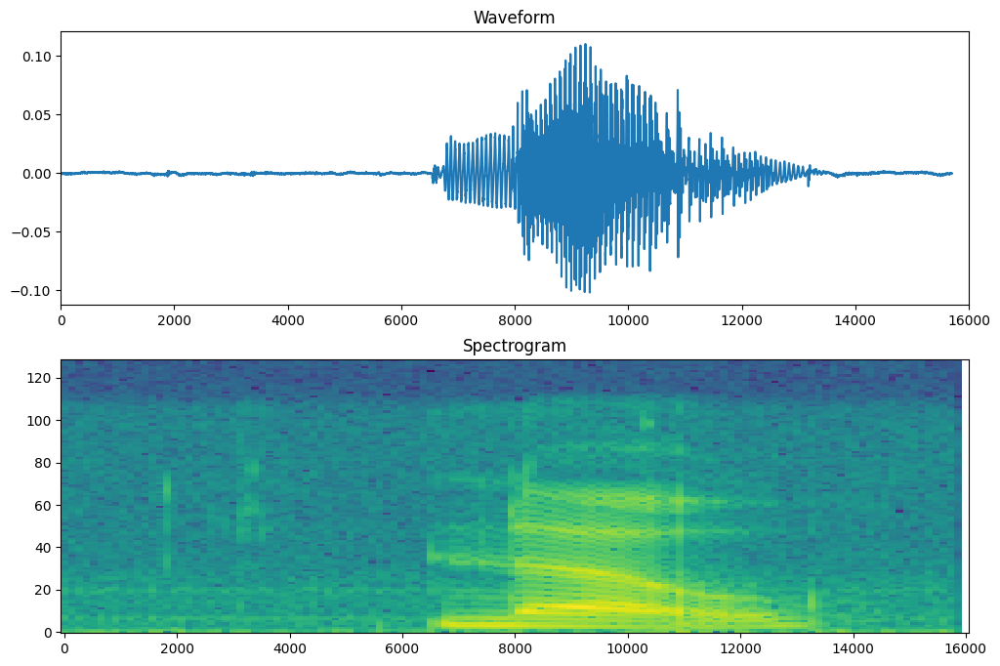

In [168]:
for waveform, label in waveform_ds.take(1):
  label = label.numpy().decode('utf-8')
  spectrogram = get_spectrogram(waveform)

print('Label:', label)
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
display.display(display.Audio(waveform, rate=16000))

def plot_spectrogram(spectrogram, ax):
  # Convert to frequencies to log scale and transpose so that the time is
  # represented in the x-axis (columns).
  log_spec = np.log(spectrogram.T)
  height = log_spec.shape[0]
  X = np.arange(16000, step=height + 1)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)


fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])
plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

C:\Users\phant\AppData\Local\Temp\ipykernel_20768\3280151817.py:4: RuntimeWarning: divide by zero encountered in log
  log_spec = np.log(spectrogram.T)


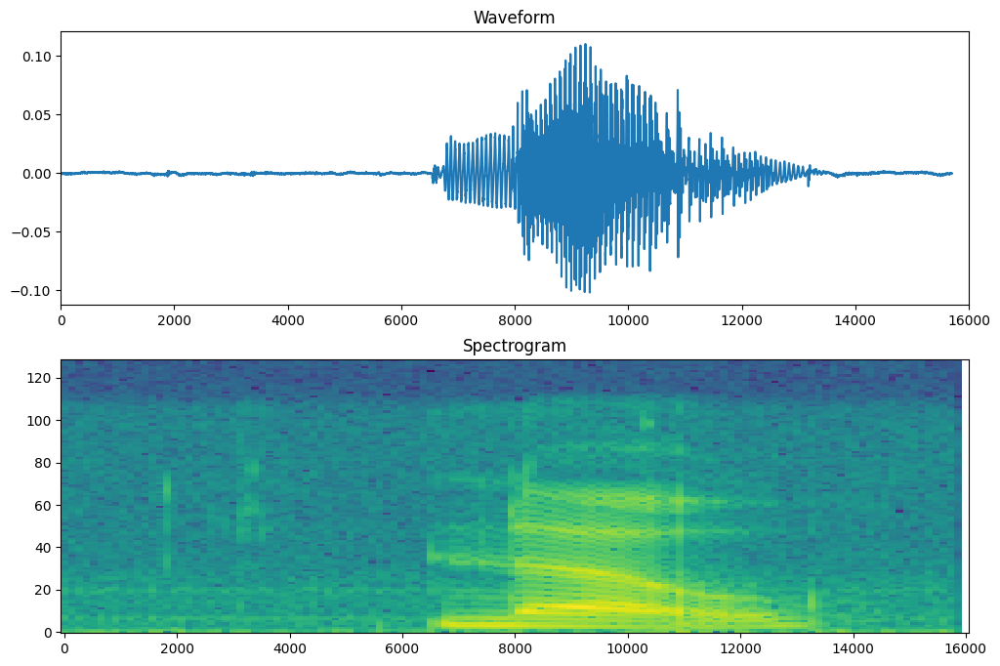

In [169]:
def plot_spectrogram(spectrogram, ax):
  # Convert to frequencies to log scale and transpose so that the time is
  # represented in the x-axis (columns).
  log_spec = np.log(spectrogram.T)
  height = log_spec.shape[0]
  X = np.arange(16000, step=height + 1)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)


fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])
plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

    Now transform the waveform dataset to have spectrogram images and their corresponding labels as integer IDs.
---
    이제 파형 데이터셋을 스펙트로그램 이미지와 해당 레이블을 정수 ID로 변환합니다.

In [170]:
def get_spectrogram_and_label_id(audio, label):
  spectrogram = get_spectrogram(audio)
  spectrogram = tf.expand_dims(spectrogram, -1)
  label_id = tf.argmax(label == commands)
  return spectrogram, label_id

In [171]:
spectrogram_ds = waveform_ds.map(
    get_spectrogram_and_label_id, num_parallel_calls=AUTOTUNE)

    Examine the spectrogram "images" for different samples of the dataset.
---
    데이터셋의 다양한 샘플에 대한 스펙트로그램 "이미지"를 검토합니다.

C:\Users\phant\AppData\Local\Temp\ipykernel_20768\3280151817.py:4: RuntimeWarning: divide by zero encountered in log
  log_spec = np.log(spectrogram.T)


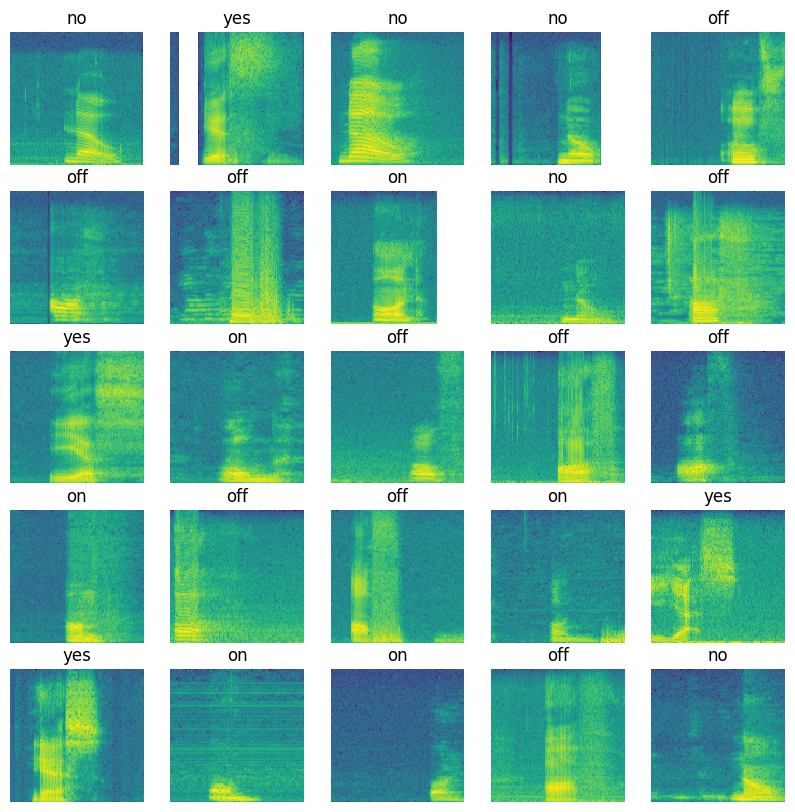

In [172]:
rows = 5
cols = 5
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
for i, (spectrogram, label_id) in enumerate(spectrogram_ds.take(n)):
  r = i // cols
  c = i % cols
  ax = axes[r][c]
  plot_spectrogram(np.squeeze(spectrogram.numpy()), ax)
  ax.set_title(commands[label_id.numpy()])
  ax.axis('off')
  
plt.show()

### Build and train the model
    Now you can build and train your model. But before you do that, you'll need to repeat the training set preprocessing on the validation and test sets.
---
### 모델 구축 및 훈련
    이제 모델을 구축하고 훈련할 수 있습니다. 하지만 그 전에 검증 및 테스트 세트에 대한 훈련 세트 전처리를 반복해야 합니다.

In [173]:
def preprocess_dataset(files):
  files_ds = tf.data.Dataset.from_tensor_slices(files)
  output_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)
  output_ds = output_ds.map(
      get_spectrogram_and_label_id,  num_parallel_calls=AUTOTUNE)
  return output_ds

In [174]:
train_ds = spectrogram_ds
val_ds = preprocess_dataset(val_files)
test_ds = preprocess_dataset(test_files)

Batch the training and validation sets for model training.<br>
모델 훈련을 위해 훈련 및 검증 세트를 배치합니다.

In [182]:
batch_size = 64
train_ds = train_ds.batch(batch_size)
val_ds = val_ds.batch(batch_size)

Add dataset [`cache()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cache) and [`prefetch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#prefetch) operations to reduce read latency while training the model.<br>모델을 훈련하는 동안 읽기 지연 시간을 줄이기 위해 데이터셋 ['cache()'](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cache) 및 ['prefetch ()'](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#prefetch) 작업을 추가합니다.

In [183]:
train_ds = train_ds.cache().prefetch(AUTOTUNE)
val_ds = val_ds.cache().prefetch(AUTOTUNE)

For the model, you'll use a simple convolutional neural network (CNN), since you have transformed the audio files into spectrogram images.
The model also has the following additional preprocessing layers:
- A [`Resizing`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/Resizing) layer to downsample the input to enable the model to train faster.
- A [`Normalization`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/Normalization) layer to normalize each pixel in the image based on its mean and standard deviation.

For the `Normalization` layer, its `adapt` method would first need to be called on the training data in order to compute aggregate statistics (i.e. mean and standard deviation).<br>
모델의 경우 오디오 파일을 스펙트로그램 이미지로 변환했기 때문에 간단한 합성곱 신경망(CNN)을 사용하게 됩니다.
이 모델에는 다음과 같은 추가 전처리 레이어도 있습니다:
- 입력을 다운샘플링하여 모델이 더 빠르게 학습할 수 있도록 하는 ['Resizing'](https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/Resizing) 레이어.
- 이미지의 각 픽셀의 평균과 표준 편차를 기준으로 정규화하는 ['정규화'](https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/Normalization) 레이어.

'정규화' 계층의 경우, 집합 통계(즉, 평균 및 표준 편차)를 계산하기 위해 먼저 학습 데이터에 '적응' 방법을 호출해야 합니다.

In [184]:
for spectrogram, _ in spectrogram_ds.take(1):
  input_shape = spectrogram.shape
print('Input shape:', input_shape)
num_labels = len(commands)

norm_layer = preprocessing.Normalization()
norm_layer.adapt(spectrogram_ds.map(lambda x, _: x))

model = models.Sequential([
    layers.Input(shape=input_shape),
    preprocessing.Resizing(32, 32), 
    norm_layer,
    layers.Conv2D(32, 3, activation='relu'),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_labels),
])

model.summary()

Input shape: (124, 129, 1)
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resizing_4 (Resizing)        (None, 32, 32, 1)         0         
_________________________________________________________________
normalization_5 (Normalizati (None, 32, 32, 1)         3         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 30, 30, 32)        320       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)        

In [187]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

In [188]:
EPOCHS = 10
history = model.fit(
    train_ds, 
    validation_data=val_ds,  
    epochs=EPOCHS,
    callbacks=tf.keras.callbacks.EarlyStopping(verbose=1, patience=2),
)

Epoch 1/10


ValueError: in user code:

    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\training.py:805 train_function  *
        return step_function(self, iterator)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\training.py:795 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1259 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2730 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3417 _call_for_each_replica
        return fn(*args, **kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\training.py:788 run_step  **
        outputs = model.train_step(data)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\training.py:754 train_step
        y_pred = self(x, training=True)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\base_layer.py:1012 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\sequential.py:375 call
        return super(Sequential, self).call(inputs, training=training, mask=mask)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\functional.py:424 call
        return self._run_internal_graph(
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\functional.py:560 _run_internal_graph
        outputs = node.layer(*args, **kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\engine\base_layer.py:1012 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\keras\layers\preprocessing\image_preprocessing.py:103 call
        outputs = image_ops.resize_images_v2(
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\util\dispatch.py:201 wrapper
        return target(*args, **kwargs)
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\ops\image_ops_impl.py:1641 resize_images_v2
        return _resize_images_common(
    c:\Users\phant\anaconda3\envs\ML\lib\site-packages\tensorflow\python\ops\image_ops_impl.py:1320 _resize_images_common
        raise ValueError('\'images\' must have either 3 or 4 dimensions.')

    ValueError: 'images' must have either 3 or 4 dimensions.


Let's check the training and validation loss curves to see how your model has improved during training.

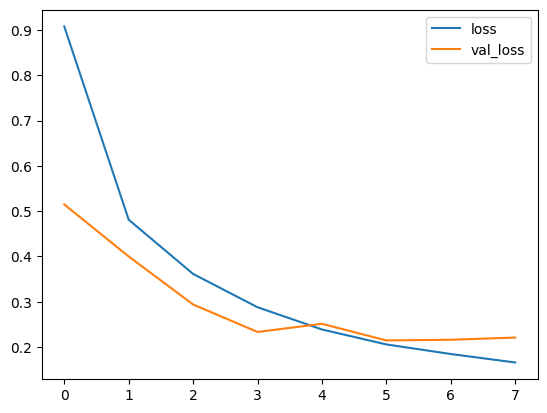

In [146]:
metrics = history.history
plt.plot(history.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.show()

### Evaluate test set performance
    Let's run the model on the test set and check performance.
---
### 테스트 세트 성능 평가
    테스트 세트에서 모델을 실행하고 성능을 확인해 보겠습니다.

In [147]:
test_audio = []
test_labels = []

for audio, label in test_ds:
  test_audio.append(audio.numpy())
  test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

In [148]:
y_pred = np.argmax(model.predict(test_audio), axis=1)
y_true = test_labels

test_acc = sum(y_pred == y_true) / len(y_true)
print(f'Test set accuracy: {test_acc:.0%}')

Test set accuracy: 94%


### Display a confusion matrix
    A confusion matrix is helpful to see how well the model did on each of the commands in the test set.
---
### 혼동 행렬 표시
    혼동 행렬은 테스트 세트의 각 명령어에서 모델이 얼마나 잘 작동했는지 확인하는 데 도움이 됩니다.

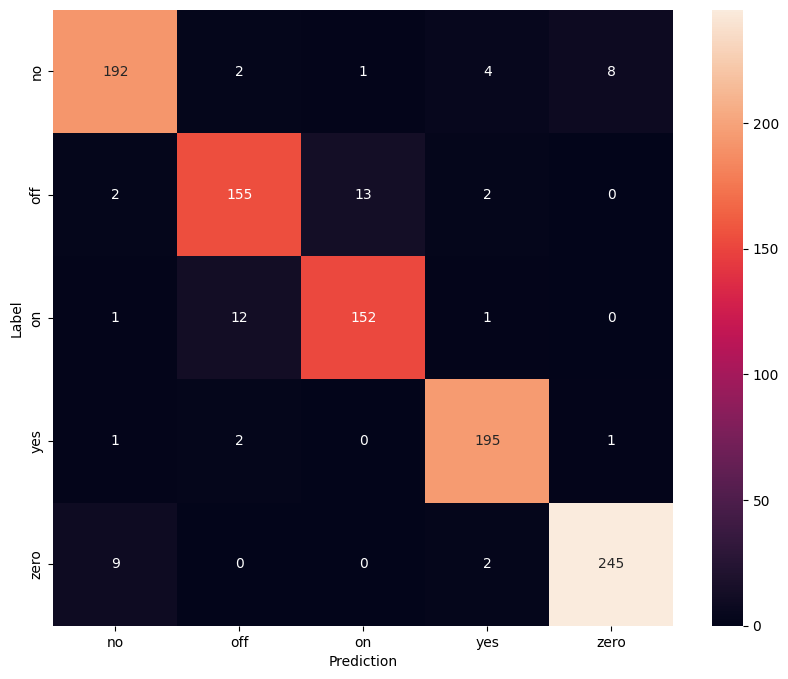

In [149]:
confusion_mtx = tf.math.confusion_matrix(y_true, y_pred) 
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, xticklabels=commands, yticklabels=commands, 
            annot=True, fmt='g')
plt.xlabel('Prediction')
plt.ylabel('Label')
plt.show()

### Run inference on an audio file
    Finally, verify the model's prediction output using an input audio file of someone saying "off." How well does your model perform?
---
### 오디오 파일에 대한 추론 실행
    마지막으로 "off"라고 말하는 사람의 입력 오디오 파일을 사용하여 모델의 예측 출력을 확인합니다. 모델의 성능은어떤가요?

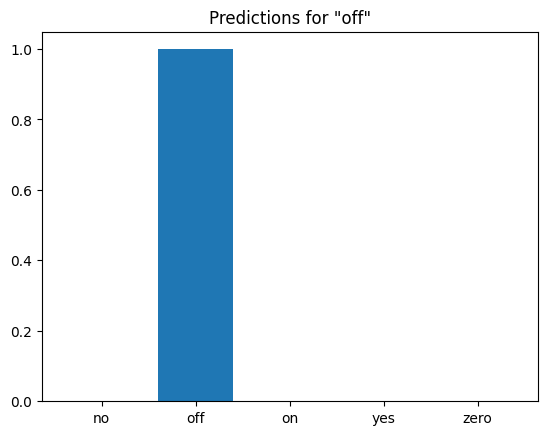

In [150]:
sample_file = data_dir/'off/0a196374_nohash_3.wav'

sample_ds = preprocess_dataset([str(sample_file)])

for spectrogram, label in sample_ds.batch(1):
  prediction = model(spectrogram)
  plt.bar(commands, tf.nn.softmax(prediction[0]))
  plt.title(f'Predictions for "{commands[label[0]]}"')
  plt.show()

### 모델양자화
    학습한 모델을 양자화 하기위하여 'tf.lite.TFLiteConverter'를 사용합니다.
---
### model quantization
    We use 'tf.lite.TFLiteConverter' to quantify the learned model.

In [151]:
# Convert the model to the TensorFlow Lite format without quantization(model_save)
# 양자화 없이 모델을 텐서플로우 라이트 형식으로 변환(model_save)
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model to disk
# 디스크에 저장장
open("audio_test.tflite", "wb").write(tflite_model)

# Convert the model to the TensorFlow Lite format with quantization
# 모델을 양자화를 통해 텐서플로우 라이트 형식으로 변환합니다
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
#양자화를 통하여 줄일때 크기ㅏ 너무작을때는 손실이 높아짐 확인해야됨.
tflite_model = converter.convert()

# Save the quantization_model to disk
# 양자화된 모델을 디스크에 저장합니다다
open("audio_test_quantized.tflite", "wb").write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\phant\AppData\Local\Temp\tmpnqsu46n2\assets


INFO:tensorflow:Assets written to: C:\Users\phant\AppData\Local\Temp\tmpnqsu46n2\assets


INFO:tensorflow:Assets written to: C:\Users\phant\AppData\Local\Temp\tmpn6jdvhzm\assets


INFO:tensorflow:Assets written to: C:\Users\phant\AppData\Local\Temp\tmpn6jdvhzm\assets


1633568

### 양자화된 모델을 기존 모델과 바이트 크기 비교
---
### Compare the quantized model to the existing model by byte size

In [153]:
# Compare the size of each model
import os
basic_model_size = os.path.getsize("audio_test.tflite")
print("Basic model is %d bytes" % basic_model_size)
quantized_model_size = os.path.getsize("audio_test_quantized.tflite")
print("Quantized model is %d bytes" % quantized_model_size)
difference = basic_model_size - quantized_model_size
print("Difference is %d bytes" % difference)

Basic model is 6504176 bytes
Quantized model is 1633568 bytes
Difference is 4870608 bytes


### 양자화된 모델을 16진화로 변환
    아두이노에 사용하기위하여 양자화된 모델을 16진화로 변환합니다. xxd를 사용하여 .cc형식으로 변환합니다.
---
### Converting quantized models to hexadecimalization
    Converts quantized models to hexadecimalization. for use in Arduino. Converts to .cc format using xxd.

In [154]:
# If does not install xxd, install it. (Only linux)
#!apt-get -qq install xxd
# A file to store a C soure file using xxd
!xxd -i audio_test_quantized.tflite > audio_test_quantized.cc
# Print the source file to monitor
# for linux
#!cat sine_model_quantized.cc 
# for Window
!type audio_test_quantized.cc 

unsigned char audio_test_quantized_tflite[] = {
  0x20, 0x00, 0x00, 0x00, 0x54, 0x46, 0x4c, 0x33, 0x00, 0x00, 0x00, 0x00,
  0x00, 0x00, 0x12, 0x00, 0x1c, 0x00, 0x04, 0x00, 0x08, 0x00, 0x0c, 0x00,
  0x10, 0x00, 0x14, 0x00, 0x00, 0x00, 0x18, 0x00, 0x12, 0x00, 0x00, 0x00,
  0x03, 0x00, 0x00, 0x00, 0x80, 0xec, 0x18, 0x00, 0x3c, 0xdc, 0x18, 0x00,
  0x24, 0xdc, 0x18, 0x00, 0x3c, 0x00, 0x00, 0x00, 0x04, 0x00, 0x00, 0x00,
  0x01, 0x00, 0x00, 0x00, 0x0c, 0x00, 0x00, 0x00, 0x08, 0x00, 0x0c, 0x00,
  0x04, 0x00, 0x08, 0x00, 0x08, 0x00, 0x00, 0x00, 0x08, 0x00, 0x00, 0x00,
  0x13, 0x00, 0x00, 0x00, 0x13, 0x00, 0x00, 0x00, 0x6d, 0x69, 0x6e, 0x5f,
  0x72, 0x75, 0x6e, 0x74, 0x69, 0x6d, 0x65, 0x5f, 0x76, 0x65, 0x72, 0x73,
  0x69, 0x6f, 0x6e, 0x00, 0x14, 0x00, 0x00, 0x00, 0xd8, 0xdb, 0x18, 0x00,
  0xc4, 0xdb, 0x18, 0x00, 0xa8, 0xda, 0x18, 0x00, 0x84, 0xd8, 0x18, 0x00,
  0x60, 0xd8, 0x18, 0x00, 0x3c, 0xd8, 0x18, 0x00, 0x18, 0xd8, 0x18, 0x00,
  0x04, 0x58, 0x00, 0x00, 0xf0, 0x4d, 0x00, 0x00, 0xdc, 0x05, 0x

  0x04, 0xe9, 0x03, 0x1d, 0x0c, 0xfb, 0xea, 0xf9, 0x0f, 0xf9, 0xfd, 0xf3,
  0x07, 0x17, 0x00, 0x15, 0x00, 0xf5, 0x16, 0xfa, 0x07, 0x08, 0xfe, 0xf9,
  0x06, 0xe2, 0xe9, 0x04, 0xfa, 0xee, 0x17, 0x01, 0x09, 0xfb, 0xf6, 0x02,
  0xfb, 0xed, 0x1c, 0xf3, 0x03, 0xf5, 0x0e, 0x10, 0x11, 0x07, 0x03, 0x02,
  0x13, 0x0c, 0xff, 0x0f, 0xfd, 0x03, 0x0a, 0xfb, 0x13, 0x0d, 0x0a, 0x04,
  0x11, 0x09, 0xfc, 0xec, 0xfd, 0x14, 0xfc, 0x0b, 0xec, 0x1a, 0x12, 0x03,
  0x16, 0xf5, 0xf1, 0x09, 0x02, 0x25, 0x12, 0x09, 0x11, 0xdf, 0xf7, 0x16,
  0xff, 0x06, 0x01, 0x00, 0x08, 0x12, 0x09, 0x19, 0xf3, 0x16, 0x0b, 0x0a,
  0xff, 0x28, 0x10, 0xf3, 0x04, 0x06, 0x14, 0x03, 0x04, 0x20, 0xfb, 0x12,
  0x0f, 0x0e, 0xfe, 0x11, 0x15, 0x13, 0xfe, 0x2c, 0xef, 0x0b, 0xf8, 0x16,
  0xff, 0x17, 0x09, 0x11, 0x19, 0x14, 0x0d, 0xf0, 0x0f, 0x09, 0xe1, 0xf5,
  0xef, 0xf9, 0x0f, 0x19, 0x13, 0xea, 0xf8, 0x09, 0xfe, 0x10, 0x11, 0xff,
  0x0f, 0xf7, 0xf2, 0x02, 0x00, 0x18, 0x10, 0x11, 0xfc, 0x05, 0x14, 0x09,
  0x09, 0xff, 0xfc, 0x0b, 0xe9, 0xf8, 

### 모델을 아두이노에 적용하기 